In [2]:
import chess
import chess.svg
import chess.engine
import random

In [59]:
result = {'win': 0, 'lose': 0, 'draw': 0}
# win is white's win
# loss is white's loss

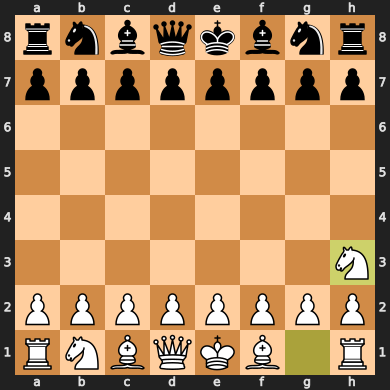

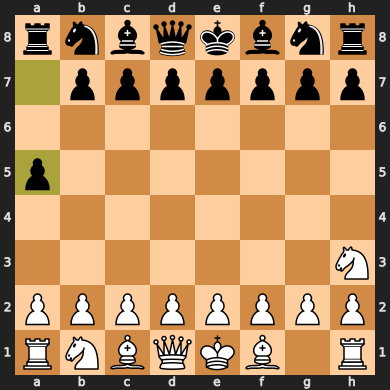

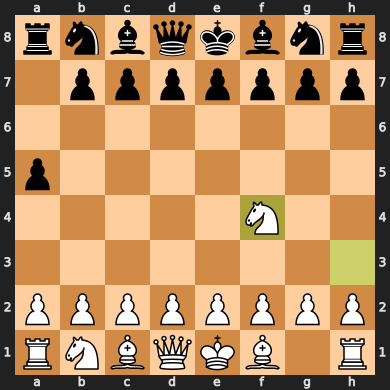

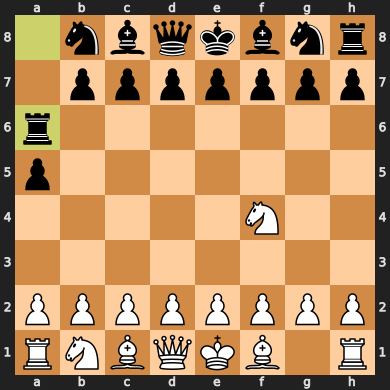

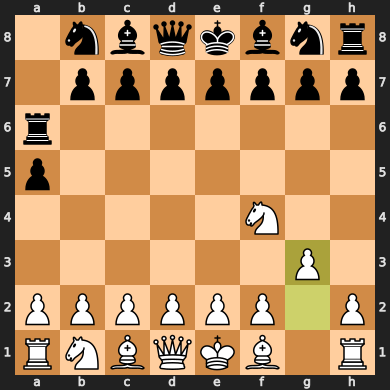

...

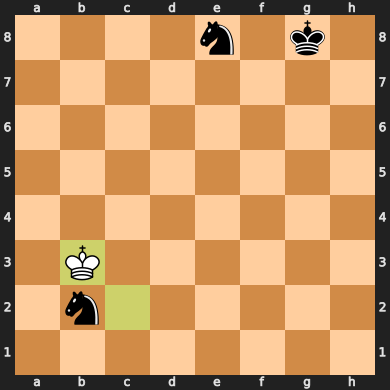

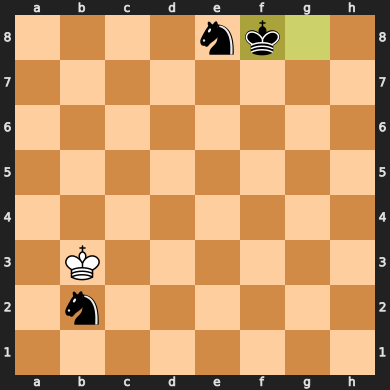

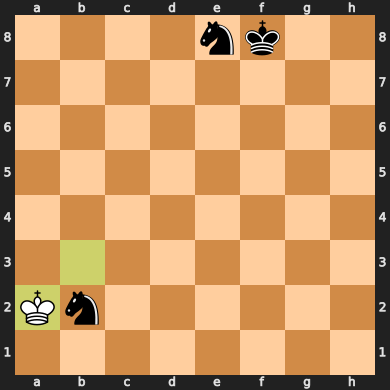

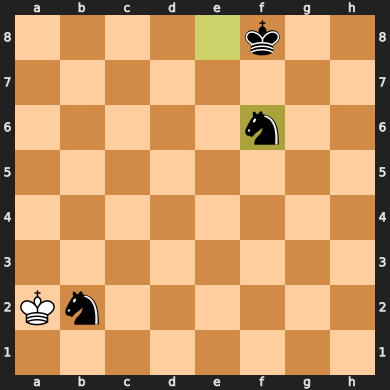

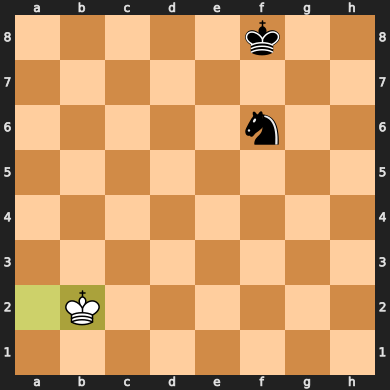

In [86]:
# game with random moves
board = chess.Board()
while not board.is_game_over():
    moves = list(board.legal_moves)
    # display(moves)
    r = random.randint(0, len(moves) - 1)
    # display(r)
    moveChosen = moves[r]
    # display(moveChosen)
    board.push(moveChosen)
    display(board)

In [61]:
# calculating outcomes
res = board.result()
# for board.result()
# white win: '1-0'
# white loss: '0-1'
# draw: '1/2-1/2'
if res == '1-0':
    result['win']+=1
elif res == '0-1':
    result['lose']+=1
else:
    result['draw']+=1

display(result)

{'win': 0, 'lose': 0, 'draw': 1}

In [62]:
# multiple games with random moves
result = {'win': 0, 'lose': 0, 'draw': 0}

for x in range(10):
    board = chess.Board()
    while not board.is_game_over():
        moves = list(board.legal_moves)
        r = random.randint(0, len(moves) - 1)
        moveChosen = moves[r]
        board.push(moveChosen)
        # display(chess.svg.board(board))
        res = board.result()
    if res == '1-0':
        result['win']+=1
    elif res == '0-1':
        result['lose']+=1
    else:
        result['draw']+=1

display(result)
# ran 10 simulations so that it would not take too long, more simulations will be needed
# all games ended in draw

{'win': 0, 'lose': 0, 'draw': 10}

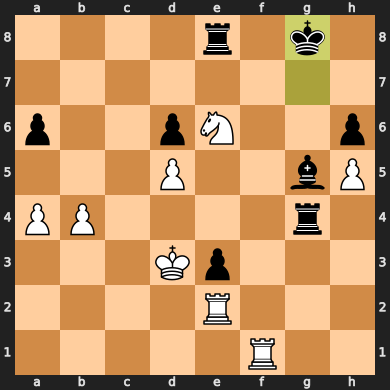

In [84]:
# generating data - stronger white, 40 plys

# average game is 84 plys, median game is 80 plys - generate a board configuration from the middle of the game (40 plys)

engine = chess.engine.SimpleEngine.popen_uci(r"C:\Users\amyta\Downloads\stockfish-windows-x86-64-avx2\stockfish\stockfish-windows-x86-64-avx2.exe")

board = chess.Board()
# display(chess.svg.board(board))

for x in range(20):
    if board.is_game_over():
        break
    # white plays stronger
    res = engine.play(board, chess.engine.Limit(time=0.1))
    board.push(res.move)
    # display(chess.svg.board(board))

    # black plays weaker
    res = engine.play(board, chess.engine.Limit(time=0.01, depth=1))
    board.push(res.move)
    # display(chess.svg.board(board))

display(board)
config = board.fen() # type string

engine.quit()

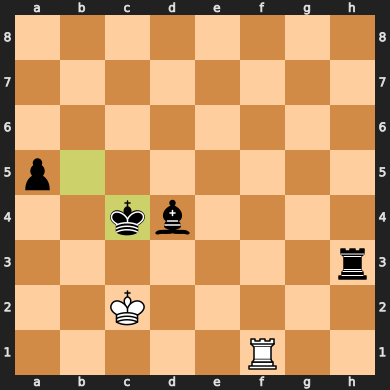

'8/8/8/p7/2kb4/7r/2K5/5R2 w - - 4 41'

In [4]:
# generating data - stronger black, 40 plys

engine = chess.engine.SimpleEngine.popen_uci(r"C:\Users\amyta\Downloads\stockfish-windows-x86-64-avx2\stockfish\stockfish-windows-x86-64-avx2.exe")

board = chess.Board()
# display(chess.svg.board(board))

for x in range(20):
    if board.is_game_over():
        break
    # white plays weaker
    res = engine.play(board, chess.engine.Limit(time=0.01, depth = 1))
    board.push(res.move)
    # display(chess.svg.board(board))

    # black plays stronger
    res = engine.play(board, chess.engine.Limit(time=0.1))
    board.push(res.move)
    # display(chess.svg.board(board))
    
display(board)
display(board.fen())
config = board.fen() # type string   

engine.quit()

In [65]:
# generating data - stronger white, 60 plys

# generate a board configuration closer to the end (60 plys)

engine = chess.engine.SimpleEngine.popen_uci(r"C:\Users\amyta\Downloads\stockfish-windows-x86-64-avx2\stockfish\stockfish-windows-x86-64-avx2.exe")

board = chess.Board()
# display(chess.svg.board(board))

for x in range(30):
    if board.is_game_over():
        break
    # white plays stronger
    res = engine.play(board, chess.engine.Limit(time=0.1))
    board.push(res.move)
    # display(chess.svg.board(board))

    # black plays weaker
    res = engine.play(board, chess.engine.Limit(time=0.01, depth=1))
    board.push(res.move)
    # display(chess.svg.board(board))
    
display(board)
config = board.fen() # type string    

engine.quit()

In [67]:
# generating data - stronger black, 60 plys

engine = chess.engine.SimpleEngine.popen_uci(r"C:\Users\amyta\Downloads\stockfish-windows-x86-64-avx2\stockfish\stockfish-windows-x86-64-avx2.exe")

board = chess.Board()
# display(chess.svg.board(board))

for x in range(30):
    if board.is_game_over():
        break
    # white plays weaker
    res = engine.play(board, chess.engine.Limit(time=0.01, depth = 1))
    board.push(res.move)
    # display(chess.svg.board(board))

    # black plays stronger
    res = engine.play(board, chess.engine.Limit(time=0.1))
    board.push(res.move)
    # display(chess.svg.board(board))

display(board)
config = board.fen() # type string

engine.quit()

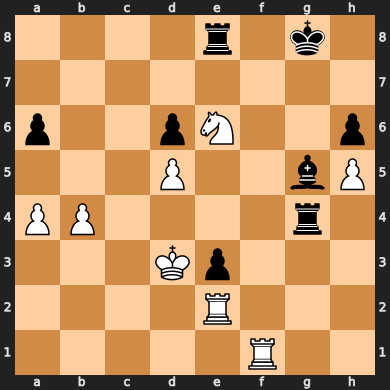

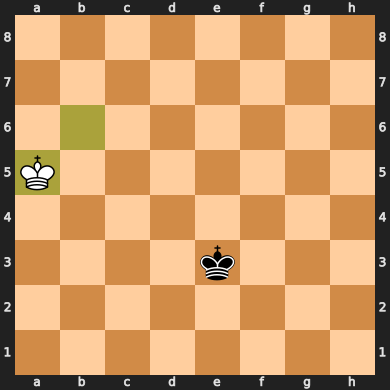

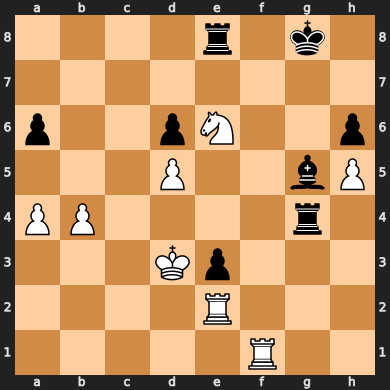

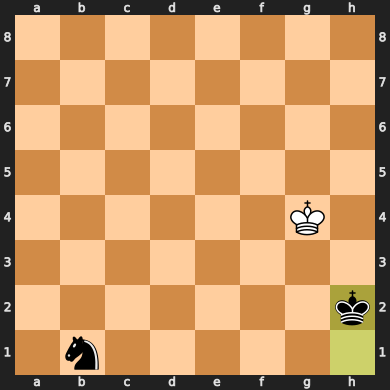

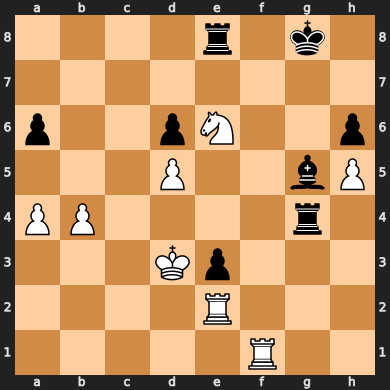

...

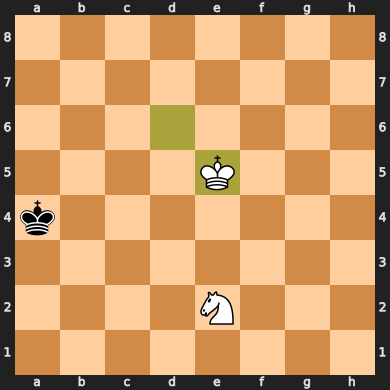

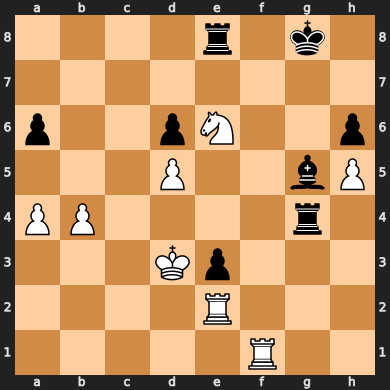

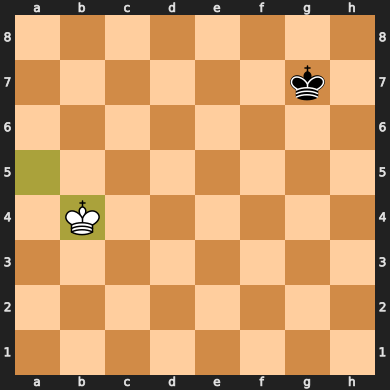

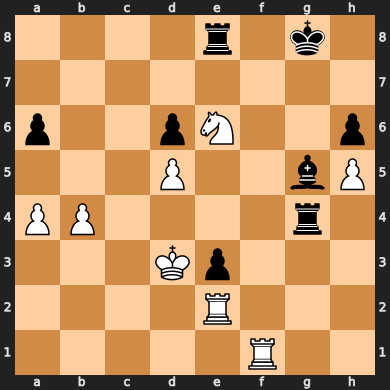

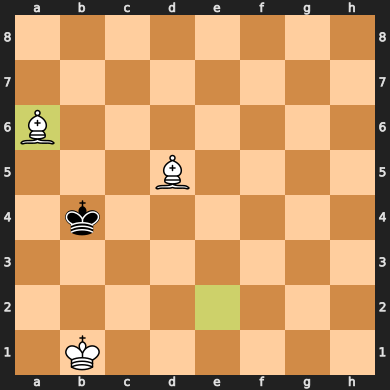

{'win': 2, 'lose': 0, 'draw': 8}

In [85]:
# multiple games of random moves starting from one of the 4 types of generated boards above
result = {'win': 0, 'lose': 0, 'draw': 0}

for x in range(10):
    board = chess.Board(config)
    display(board)
    while not board.is_game_over():
        moves = list(board.legal_moves)
        r = random.randint(0, len(moves) - 1)
        moveChosen = moves[r]
        board.push(moveChosen)
        # display(chess.svg.board(board))
        res = board.result()
    if res == '1-0':
        result['win']+=1
    elif res == '0-1':
        result['lose']+=1
    else:
        result['draw']+=1
    display(board)

display(result)

'rnbqkbnr/pppp1ppp/4p3/8/8/5N2/PPPPPPPP/RNBQKB1R w KQkq - 0 2'

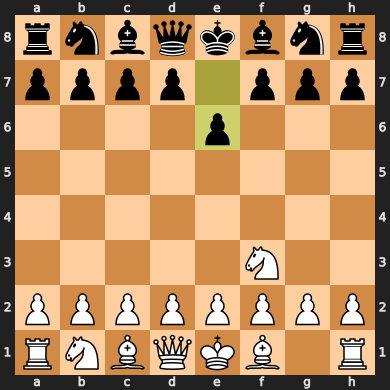

'rnbqkb1r/pppp1ppp/4pn2/8/2P5/5N2/PP1PPPPP/RNBQKB1R w KQkq - 1 3'

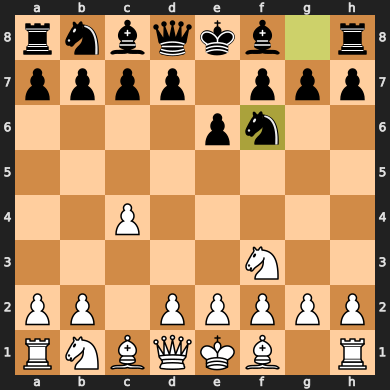

'rnbqkb1r/ppp2ppp/4pn2/3p4/2PP4/5N2/PP2PPPP/RNBQKB1R w KQkq - 0 4'

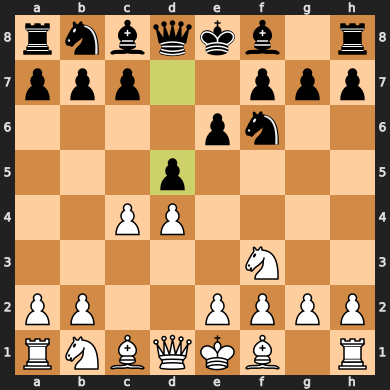

'rnbqk2r/ppp1bppp/4pn2/3p4/2PP4/4PN2/PP3PPP/RNBQKB1R w KQkq - 1 5'

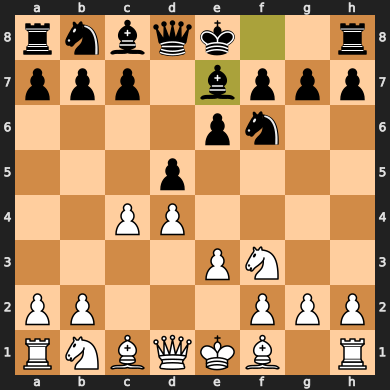

'rnbq1rk1/ppp1bppp/4pn2/3p4/2PP4/1P2PN2/P4PPP/RNBQKB1R w KQ - 1 6'

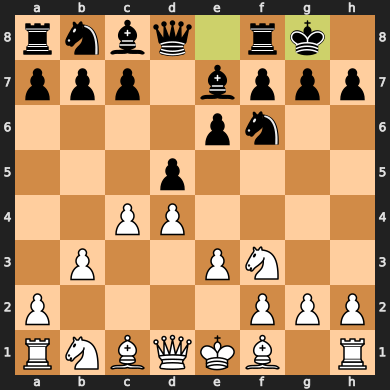

'rnbq1rk1/pp2bppp/4pn2/2pp4/2PP4/1P2PN2/PB3PPP/RN1QKB1R w KQ - 0 7'

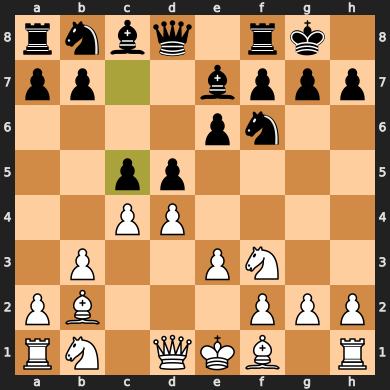

'rnbq1rk1/pp2bppp/4pn2/2P5/2p5/1P2PN2/PB3PPP/RN1QKB1R w KQ - 0 8'

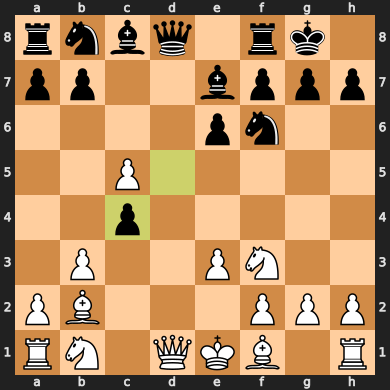

'rnbr2k1/pp2bppp/4pn2/2P5/2p5/1P2PN2/PB3PPP/RN2KB1R w KQ - 0 9'

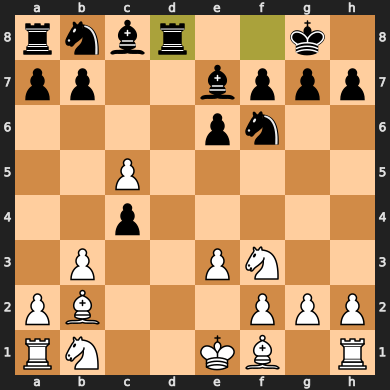

'rnbr2k1/pp2bppp/4p3/2P5/2B1n3/1P2PN2/PB3PPP/RN2K2R w KQ - 1 10'

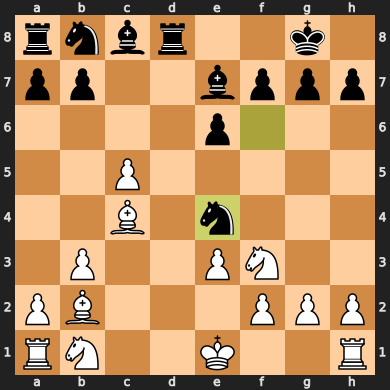

'rnbr2k1/1p2bppp/4p3/p1P5/1PB1n3/4PN2/PB3PPP/RN2K2R w KQ - 0 11'

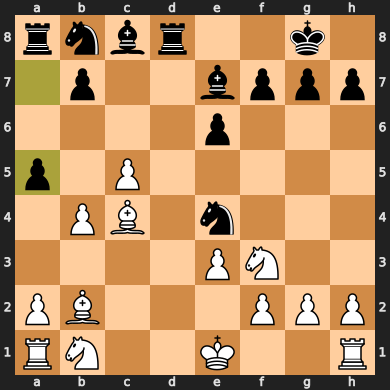

'r1br2k1/1p2bppp/2n1p3/p1P5/1PB1n3/P3PN2/1B3PPP/RN2K2R w KQ - 1 12'

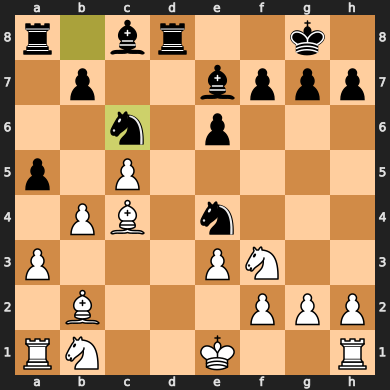

'rnbr2k1/1p2bppp/4p3/pPP5/2B1n3/P3PN2/1B3PPP/RN2K2R w KQ - 1 13'

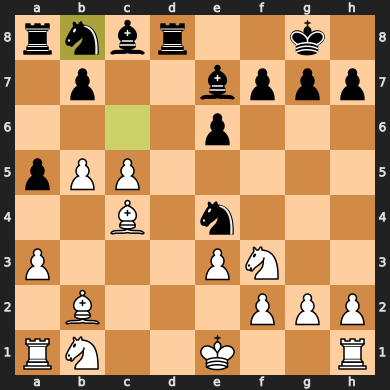

'rnbr2k1/1p2bppp/4p3/pPn5/2B3P1/P3PN2/1B3P1P/RN2K2R w KQ - 0 14'

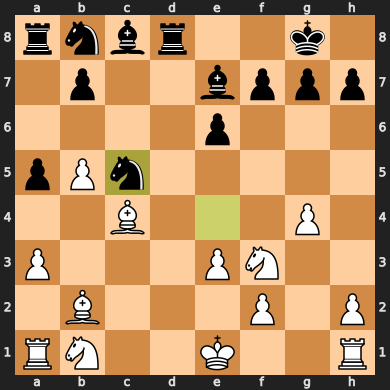

'r1br2k1/1p1nbppp/4p3/pPn3P1/2B5/P3PN2/1B3P1P/RN2K2R w KQ - 1 15'

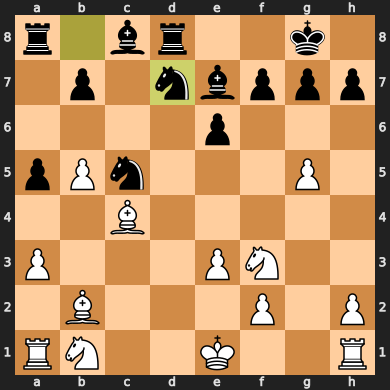

'r1br2k1/1p2bppp/1n2p3/pPn3P1/2B5/P3PN2/1B1N1P1P/R3K2R w KQ - 3 16'

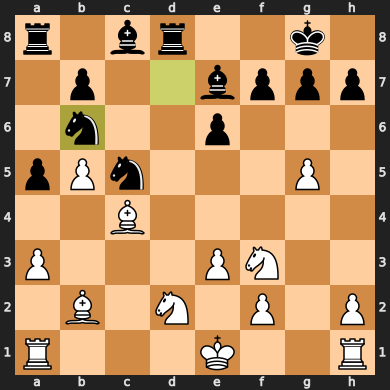

'r1br2k1/1p2bppp/4p3/pPn3P1/n7/P3PN2/1B1NBP1P/R3K2R w KQ - 5 17'

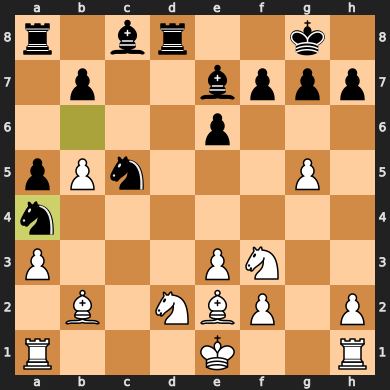

'r1br2k1/1p2bppp/8/pPn1p1P1/n2B4/P3PN2/3NBP1P/R3K2R w KQ - 0 18'

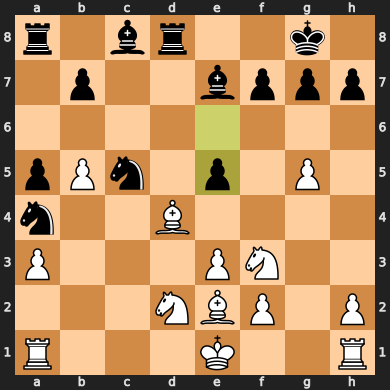

'r1br2k1/1p2bppp/8/pP2B1P1/n7/P2nPN2/3NBP1P/R3K2R w KQ - 1 19'

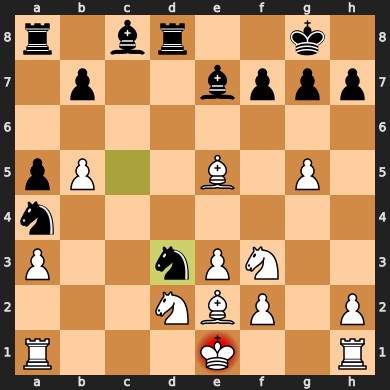

'r1b3k1/1p2bppp/8/pP2B1P1/n7/P2rPN2/3N1P1P/R3K2R w KQ - 0 20'

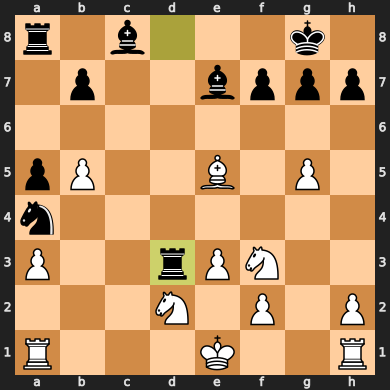

'r5k1/1p1bbppp/8/pP2B1P1/n7/P2rPN2/3N1P1P/R4RK1 w - - 2 21'

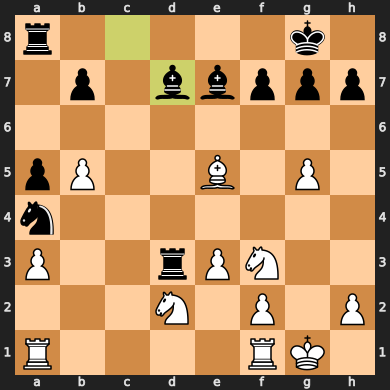

'r5k1/1p2bppp/8/pb2B1P1/n7/P2rPN2/3N1P1P/R1R3K1 w - - 0 22'

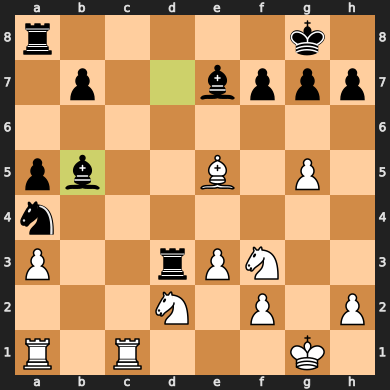

'r3b1k1/1p2bppp/8/p3B1P1/n2N4/P2rP3/3N1P1P/R1R3K1 w - - 2 23'

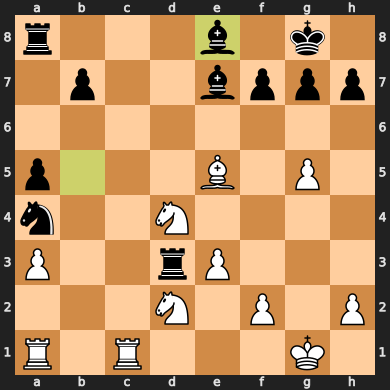

'r3b1k1/1p3ppp/8/p3B1P1/n2NN3/b2rP3/5P1P/R1R3K1 w - - 0 24'

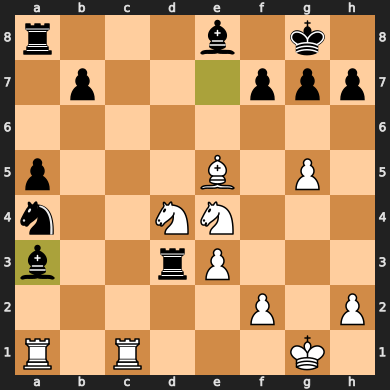

'r3b1k1/1pR2ppp/8/p3B1P1/n2NN3/3rP3/1b3P1P/R5K1 w - - 2 25'

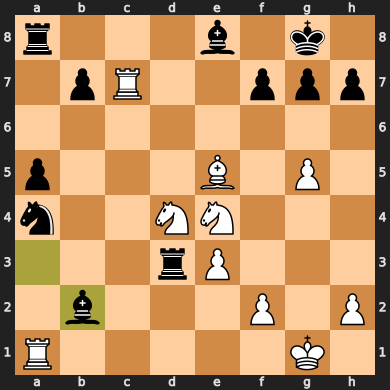

'r3b1k1/2R2ppp/8/pp2B1P1/n2NN3/3rP3/Rb3P1P/6K1 w - - 0 26'

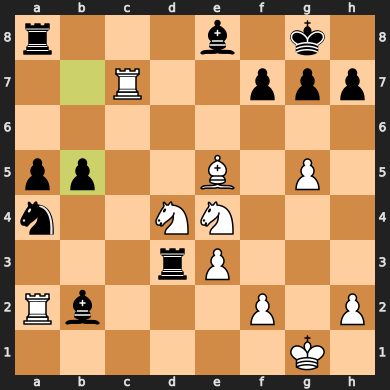

'r3b1k1/2R2ppp/3N4/pp2B1P1/n2N4/2brP3/R4P1P/6K1 w - - 2 27'

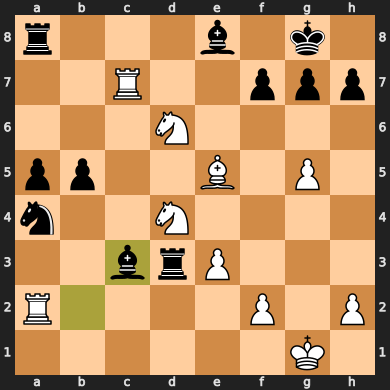

'r3b1k1/4Rppp/3N4/pp2B1P1/n2b4/3rP3/R4P1P/6K1 w - - 0 28'

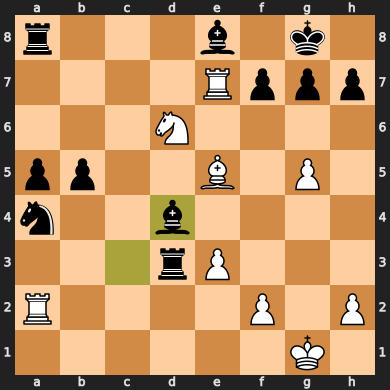

'r3bk2/4Rppp/3N4/pp2B1P1/n2P4/3r4/R4P1P/6K1 w - - 1 29'

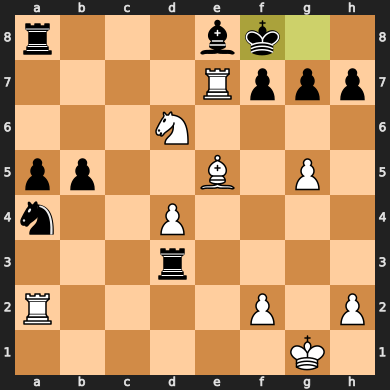

'r3bk2/2R2ppp/3N4/pp2B1P1/3P4/2nr4/R4P1P/6K1 w - - 3 30'

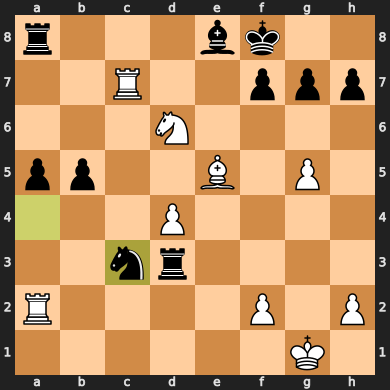

'r3k3/2R2ppp/8/pp2B1P1/3P4/2nr4/R4P1P/6K1 w - - 0 31'

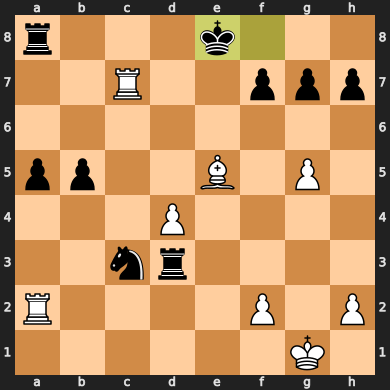

'r3k3/2R2ppp/8/pp2B1P1/3P4/3r4/4nP1P/R5K1 w - - 2 32'

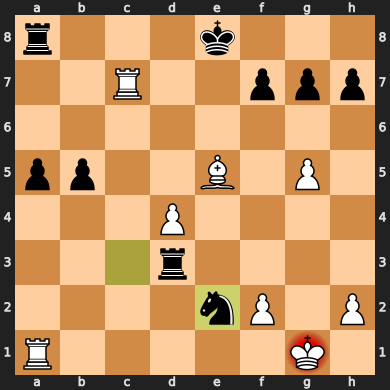

'r3k3/2R2ppp/8/pp2B1P1/3n4/3r4/5P1P/R4K2 w - - 0 33'

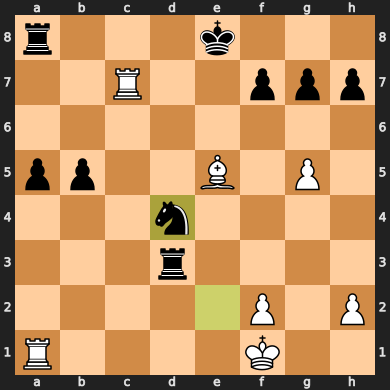

'r3k3/1R3ppp/8/pp2B1P1/8/3r4/2n2P1P/R4K2 w - - 2 34'

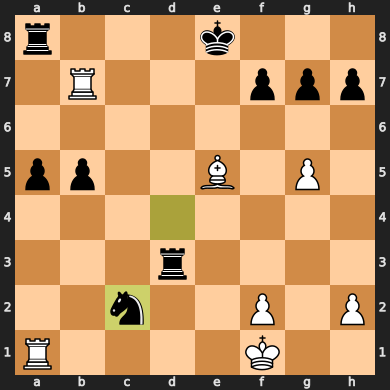

'r3k3/1R3ppp/8/pp1rB1P1/8/8/2n2P1P/2R2K2 w - - 4 35'

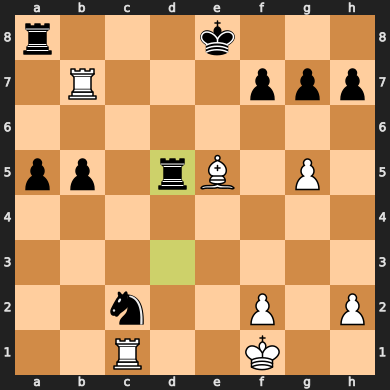

'r3k3/1R3ppp/8/p2r2P1/1p6/2B5/2n2P1P/2R2K2 w - - 0 36'

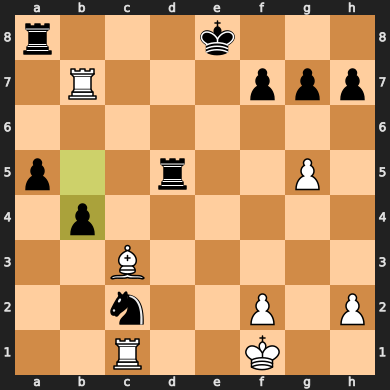

'r3k3/1R3ppp/8/p2r2P1/8/2p5/2R2P1P/5K2 w - - 0 37'

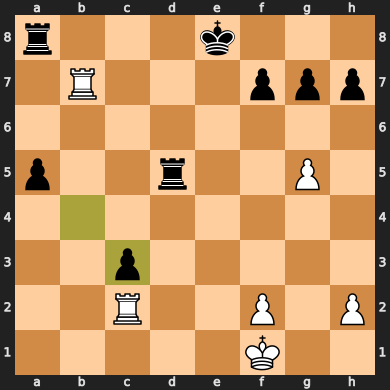

'r3k3/1R1r1ppp/8/p5P1/8/2R5/5P1P/5K2 w - - 1 38'

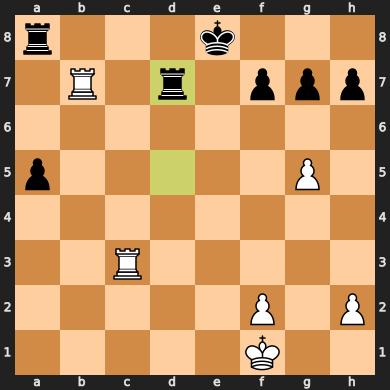

'r2k4/1R1r1ppp/8/p5P1/8/4R3/5P1P/5K2 w - - 3 39'

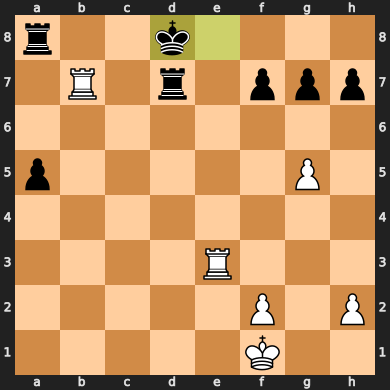

'3k4/r2r1ppp/8/p5P1/8/1R2R3/5P1P/5K2 w - - 5 40'

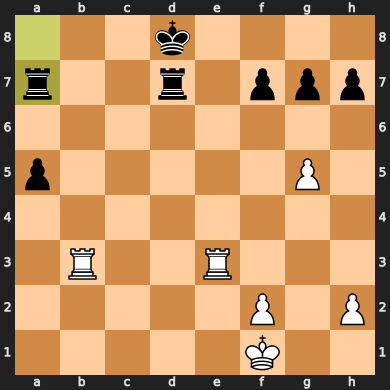

'3k4/r4ppp/8/p2r2P1/4R3/1R6/5P1P/5K2 w - - 7 41'

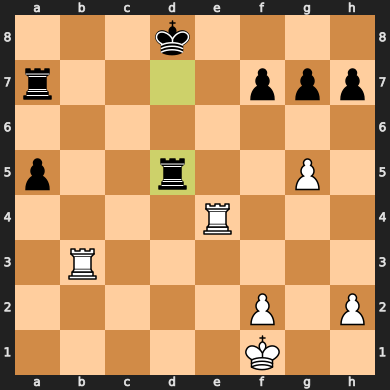

'3k4/r4ppp/8/3r2P1/p3R2P/1R6/5P2/5K2 w - - 0 42'

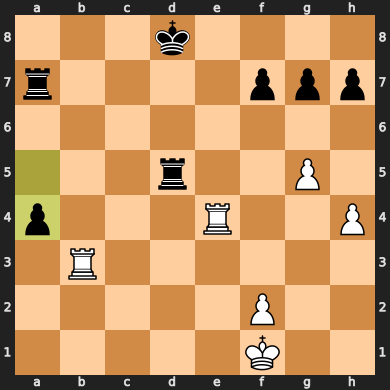

'3k4/r4ppp/8/r5P1/p3R2P/R7/5P2/5K2 w - - 2 43'

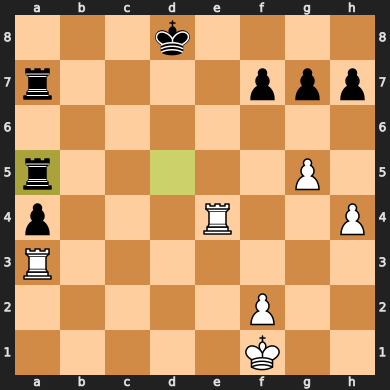

'8/r3kppp/8/r5P1/p4R1P/R7/5P2/5K2 w - - 4 44'

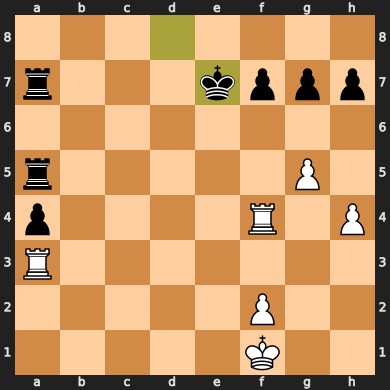

'8/r4ppp/3k4/r5P1/p4R1P/R7/5PK1/8 w - - 6 45'

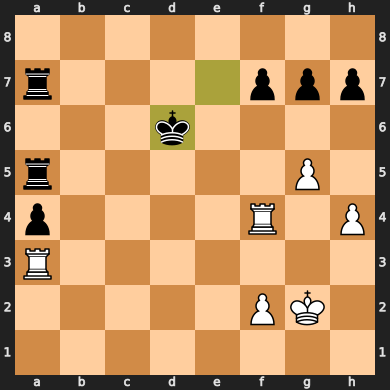

'8/r4ppp/8/r1k3P1/p4R1P/R7/5P2/5K2 w - - 8 46'

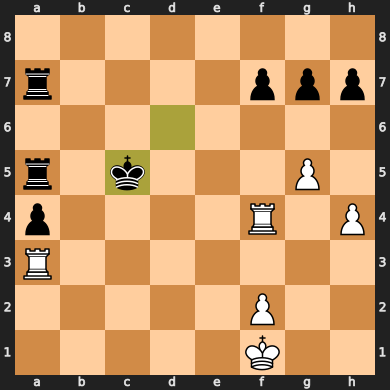

'8/r4ppp/1k6/r5P1/p4R1P/2R5/5P2/5K2 w - - 10 47'

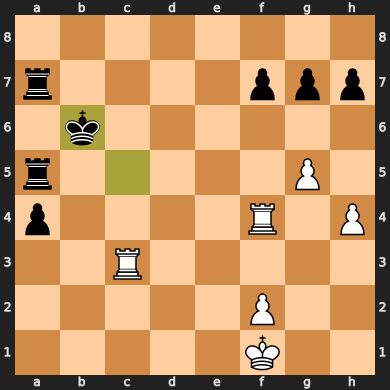

'8/r4ppp/1k6/r5P1/5R1P/p7/5P2/2R2K2 w - - 0 48'

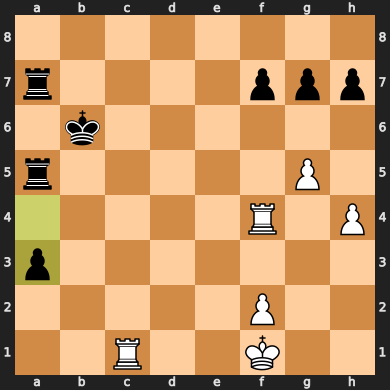

'8/r4ppp/1k6/r5P1/6RP/8/p4P2/2R2K2 w - - 0 49'

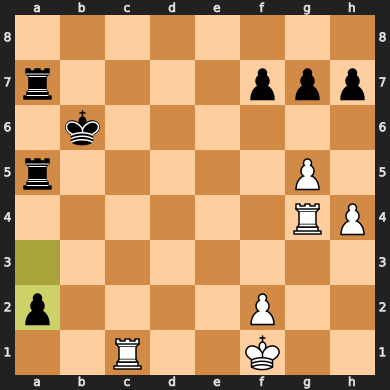

'8/r4ppp/1k6/1r4P1/6RP/8/p4P2/R4K2 w - - 2 50'

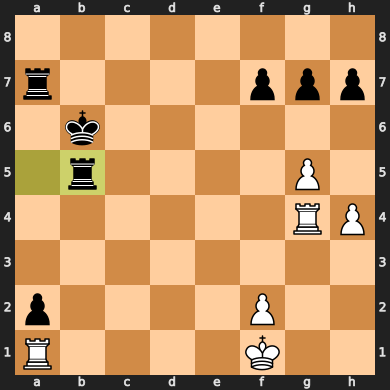

'8/r4ppp/1k6/6P1/6RP/8/p4PK1/Rr6 w - - 4 51'

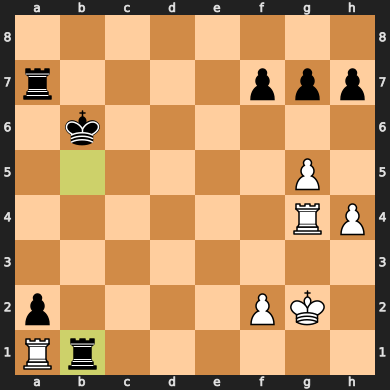

'8/5ppp/1k6/6P1/6RP/8/r4PK1/1r6 w - - 0 52'

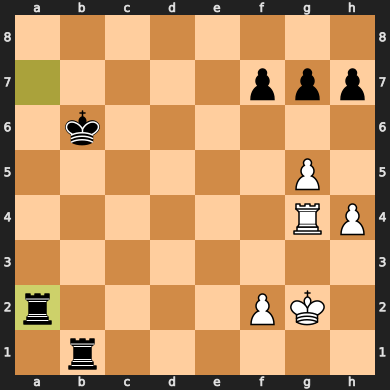

'8/5ppp/1k6/6P1/4R2P/8/rr3PK1/8 w - - 2 53'

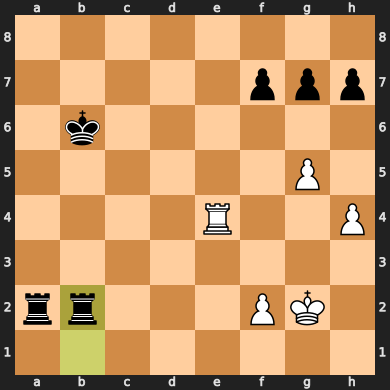

'8/r4ppp/1k6/6P1/5R1P/8/1r3PK1/8 w - - 4 54'

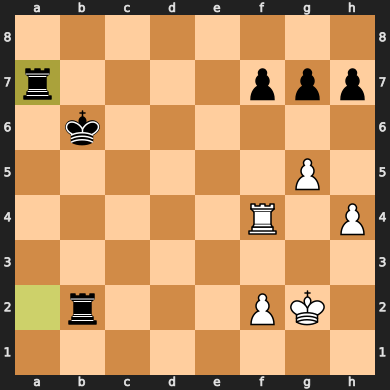

'8/r4ppp/8/2k3P1/3R3P/8/1r3PK1/8 w - - 6 55'

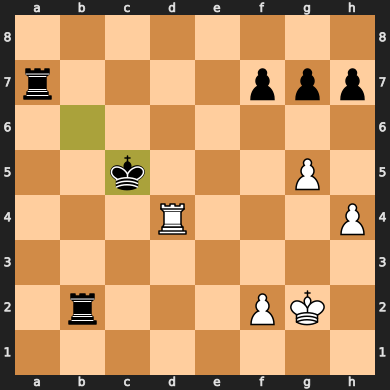

'8/r4ppp/8/2k3P1/1r5P/3R4/5PK1/8 w - - 8 56'

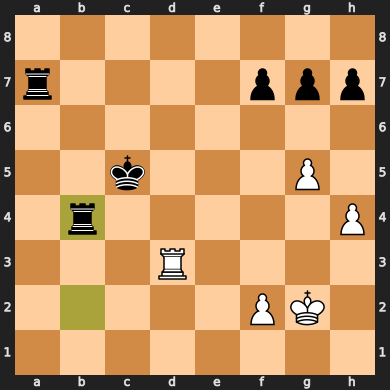

'8/r4ppp/8/2k3P1/2r4P/2R5/5PK1/8 w - - 10 57'

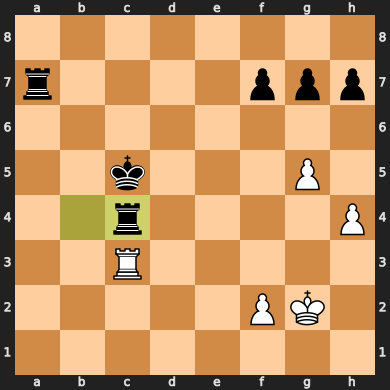

'8/r4ppp/8/6P1/1kr4P/7R/5PK1/8 w - - 12 58'

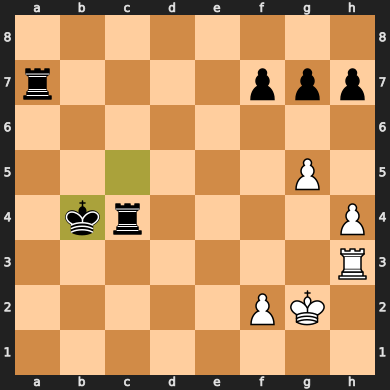

'8/r4ppp/8/6P1/2r4P/2k5/5PK1/7R w - - 14 59'

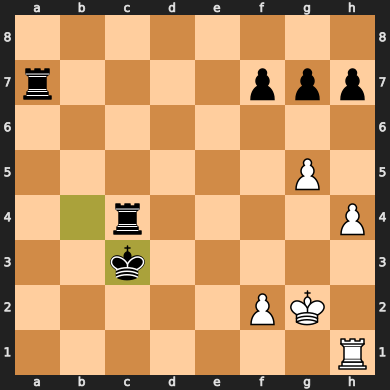

'8/r4ppp/8/6P1/2r4P/6K1/3k1P2/7R w - - 16 60'

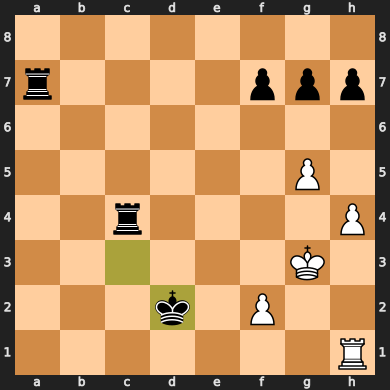

'8/r5pp/8/5pP1/2r4P/6K1/3k1P2/1R6 w - f6 0 61'

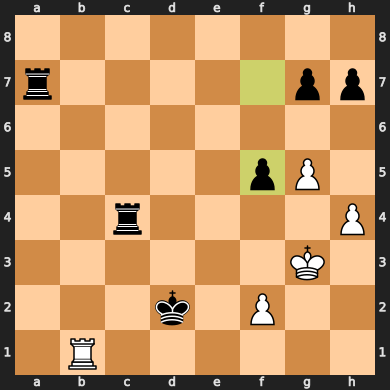

'8/r6p/5p2/8/2r4P/6K1/3k1P2/1R6 w - - 0 62'

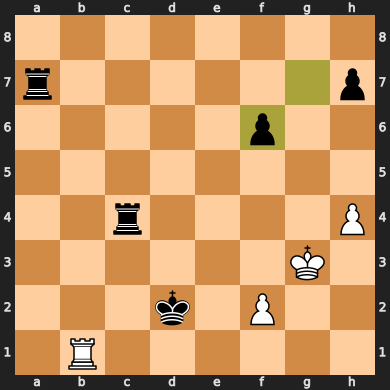

'8/r6p/5p2/8/7P/6K1/1Rrk1P2/8 w - - 2 63'

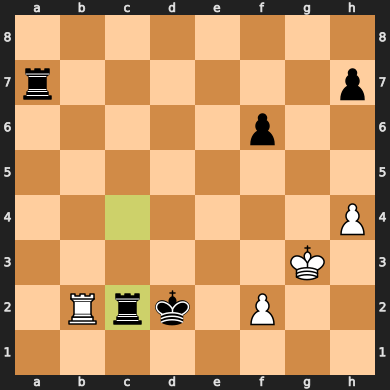

'8/5r1p/1R3p2/8/7P/6K1/2rk1P2/8 w - - 4 64'

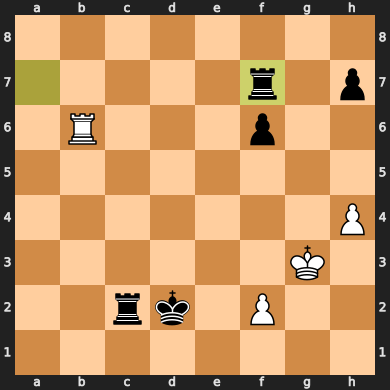

'8/6rp/1R3p2/8/7P/8/2rk1PK1/8 w - - 6 65'

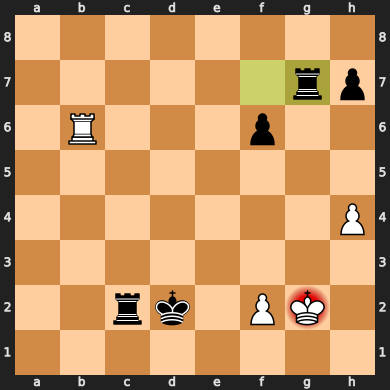

'8/6rp/1R6/5p2/7P/7K/2rk1P2/8 w - - 0 66'

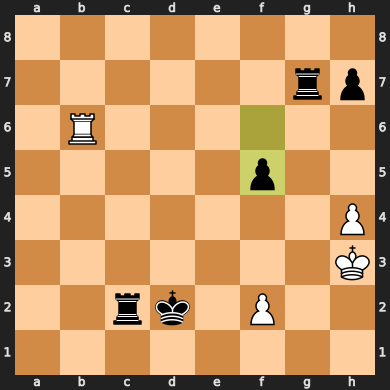

'8/6rp/1R6/5p2/7P/5P1K/2r1k3/8 w - - 1 67'

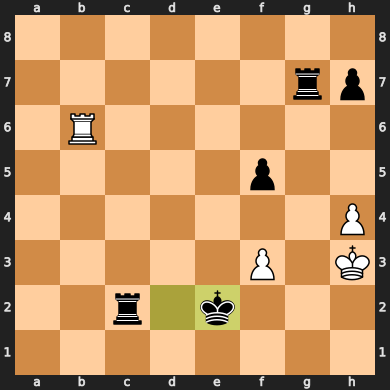

'8/6rp/1R6/5p1P/8/5k1K/2r5/8 w - - 0 68'

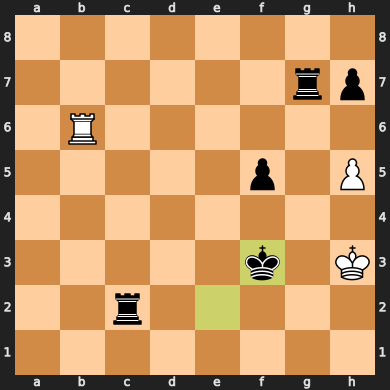

'8/6rp/8/5p1P/8/1R5K/2r2k2/8 w - - 2 69'

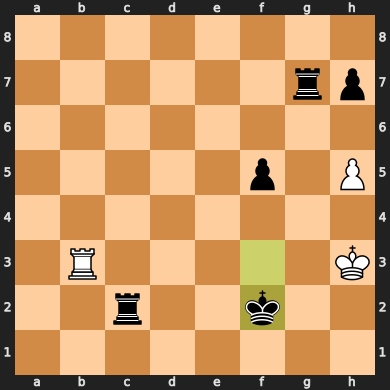

'8/7p/6rP/5p2/8/1R5K/2r2k2/8 w - - 1 70'

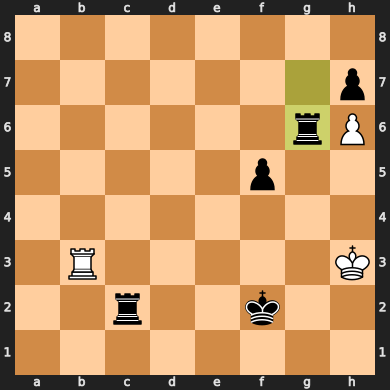

'8/7p/6rP/8/5p1K/1R6/2r2k2/8 w - - 0 71'

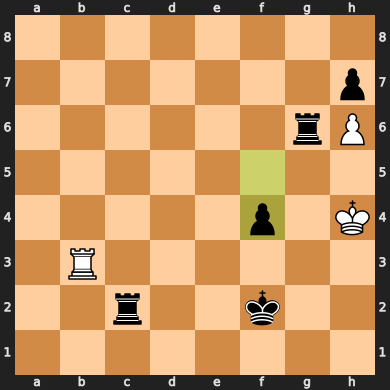

'8/7p/6rP/8/8/1R3p1K/2r2k2/8 w - - 0 72'

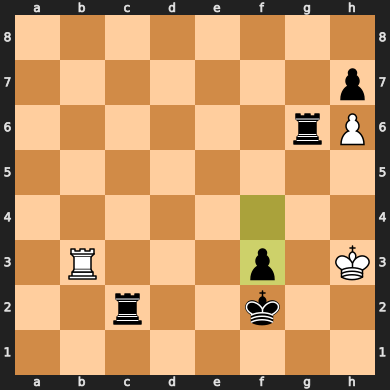

'8/1R5p/7r/8/8/5p1K/2r2k2/8 w - - 0 73'

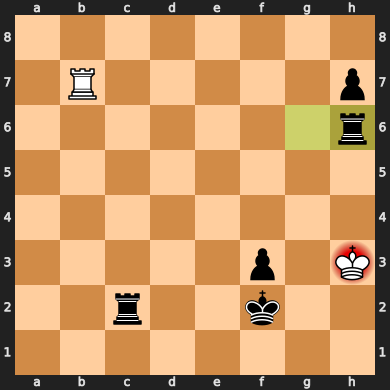

'8/1R5p/7r/8/2r3K1/5p2/5k2/8 w - - 2 74'

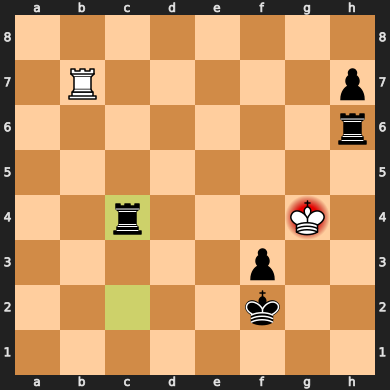

'8/1R5p/7r/6K1/7r/5p2/5k2/8 w - - 4 75'

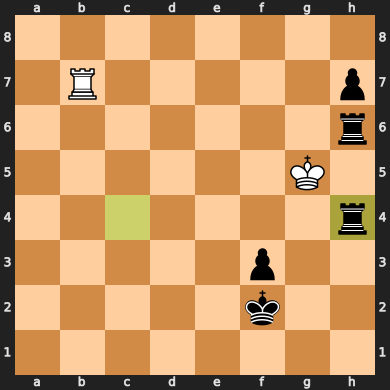

'8/7p/7r/6K1/7r/5p2/6k1/1R6 w - - 6 76'

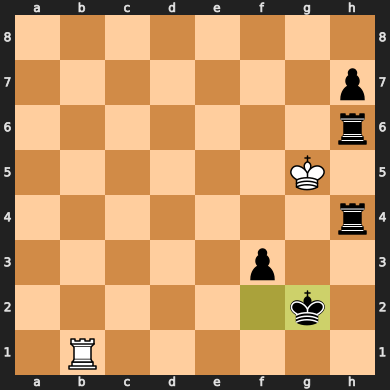

'8/7p/7r/6K1/7r/5pk1/1R6/8 w - - 8 77'

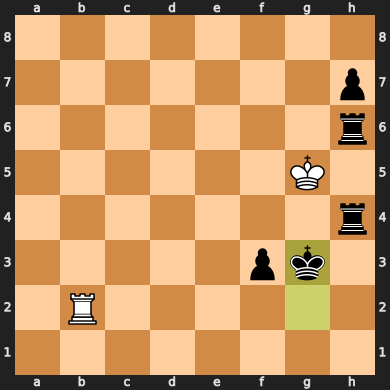

'8/7p/7r/5K2/7r/6k1/1R3p2/8 w - - 0 78'

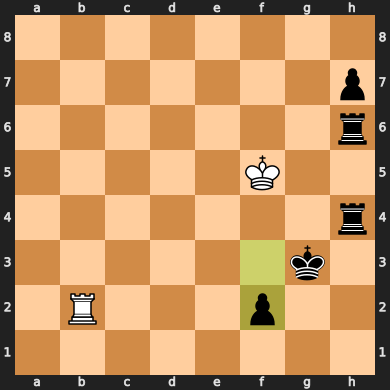

'8/7p/7r/5K2/7r/1R6/5pk1/8 w - - 2 79'

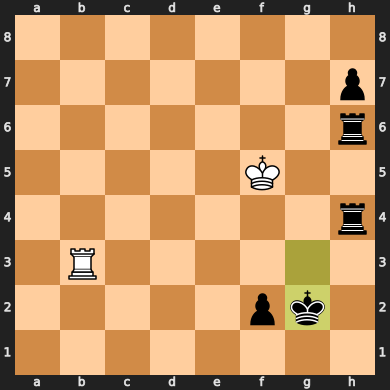

'8/7p/7r/4K3/7r/1R6/6k1/5q2 w - - 0 80'

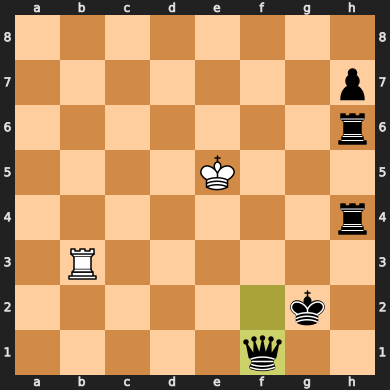

'8/7p/7r/4K3/5q1r/8/6k1/1R6 w - - 2 81'

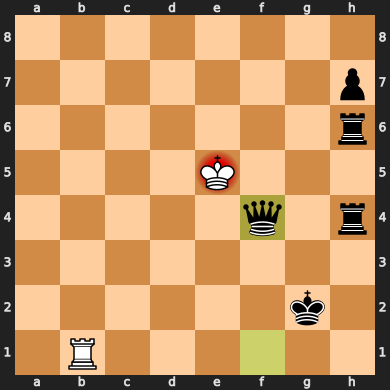

'8/7p/7r/3K1q2/7r/8/6k1/1R6 w - - 4 82'

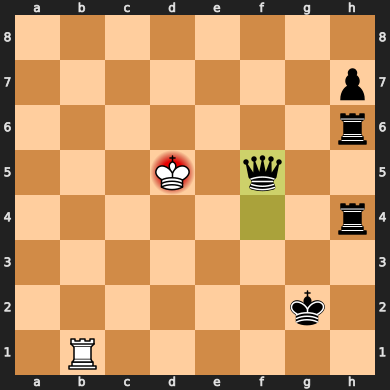

In [6]:
# getting a configuration where white almost wins for the simulation
engine = chess.engine.SimpleEngine.popen_uci(r"C:\Users\amyta\Downloads\stockfish-windows-x86-64-avx2\stockfish\stockfish-windows-x86-64-avx2.exe")

board = chess.Board()

while not board.is_game_over():
    # white plays weaker
    res = engine.play(board, chess.engine.Limit(time=0.01, depth = 1))
    board.push(res.move)
    # display(board)

    # black plays stronger
    res = engine.play(board, chess.engine.Limit(time=0.1))
    board.push(res.move)
    # display(board)
    display(board.fen())
    display(board)

engine.quit()

In [11]:
board.outcome().termination.value == 1

True